First step is to inport to csv with all of the data and do some anylisis on it.

-search for any null values
-make some graphs and charts to visiulize data


In [65]:
import pandas as pd
from tabulate import tabulate
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
data = pd.read_csv("Extended_Employee_Performance_and_Productivity_Data.csv")

#convert education level to numarical values from 0-3
data['Education_Level'] = data['Education_Level'].replace('High School', '0')
data['Education_Level'] = data['Education_Level'].replace('Bachelor', '1')
data['Education_Level'] = data['Education_Level'].replace('Master', '2')
data['Education_Level'] = data['Education_Level'].replace('Phd', '3')

data['Education_Level'] = pd.to_numeric(data['Education_Level'], errors='coerce')
data['Education_Level'] = data['Education_Level'].fillna(0).astype('int64')

# Display the first few rows of the dataset as a nicely formatted table
print("First five rows of the dataset:")
print(tabulate(data.head(), headers='keys', tablefmt='pretty'))

# Check for null values
print("\nNull values in each column:")
print(data.isnull().sum())

# Get data types of each column
print("\nData types of each column:")
print(data.dtypes)

# Basic statistical summary
print("\nStatistical summary of numerical columns:")
print(data.describe())

# Information on the dataset
print("\nGeneral info about the dataset:")
print(data.info())





First five rows of the dataset:
+---+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+------------+-----------------------------+----------+
|   | Employee_ID |    Department    | Gender | Age | Job_Title  |         Hire_Date          | Years_At_Company | Education_Level | Performance_Score | Monthly_Salary | Work_Hours_Per_Week | Projects_Handled | Overtime_Hours | Sick_Days | Remote_Work_Frequency | Team_Size | Training_Hours | Promotions | Employee_Satisfaction_Score | Resigned |
+---+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------

In [66]:

# I want ot see all the employess that resigned just to see if they have anything in common

# Filter for employees who resigned
resigned_employees = data[data['Resigned'] == True]

# Display the names of all employees who resigned
# Replace 'Employee_Name' with the actual column name for employee names in your dataset
print("List of employees who resigned:")
print(tabulate(resigned_employees[['Employee_ID',  'Department', 'Gender', 'Age',  'Job_Title',  'Hire_Date',  'Years_At_Company',  'Education_Level',  'Performance_Score', 'Monthly_Salary',  'Work_Hours_Per_Week', 'Projects_Handled',  'Overtime_Hours',  'Sick_Days', 'Remote_Work_Frequency', 'Team_Size',  'Training_Hours',  'Promotions',  'Employee_Satisfaction_Score']].head(), headers='keys', tablefmt='pretty'))

List of employees who resigned:
+----+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+------------+-----------------------------+
|    | Employee_ID |    Department    | Gender | Age | Job_Title  |         Hire_Date          | Years_At_Company | Education_Level | Performance_Score | Monthly_Salary | Work_Hours_Per_Week | Projects_Handled | Overtime_Hours | Sick_Days | Remote_Work_Frequency | Team_Size | Training_Hours | Promotions | Employee_Satisfaction_Score |
+----+-------------+------------------+--------+-----+------------+----------------------------+------------------+-----------------+-------------------+----------------+---------------------+------------------+----------------+-----------+-----------------------+-----------+----------------+-

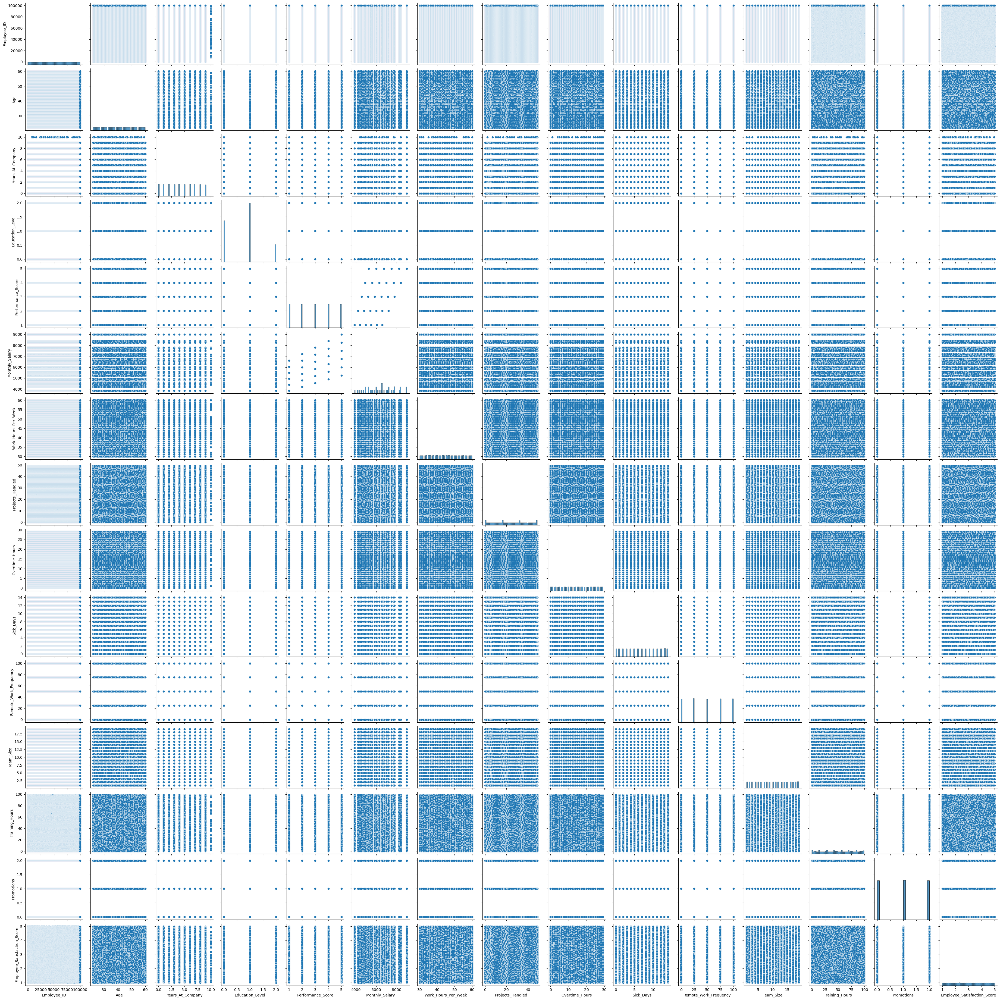

In [67]:
#Visualize the distribution of numerical columns.
# Select numerical columns only
numerical_cols = data.select_dtypes(include=['float64', 'int64'])

# Create pairplot for the numerical columns
sns.pairplot(numerical_cols)

# Show the plot
plt.show()

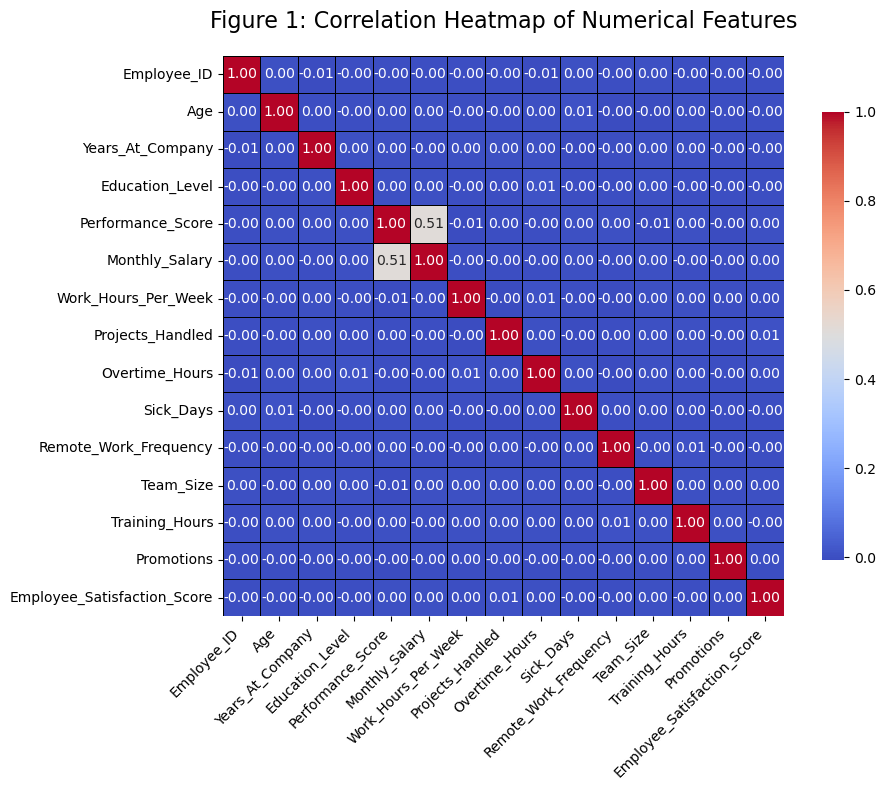

In [68]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
# data = pd.read_csv('your_dataset.csv')  # Uncomment and load your dataset here

# Select numerical features
numerical_features = data.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numerical_features.corr()

# Plot a heatmap to visualize the correlation
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,  # Show correlation values
    cmap='coolwarm',  # Use 'coolwarm' color scheme
    fmt='.2f',  # Format the correlation values
    square=True,  # Make each cell square
    cbar_kws={"shrink": 0.8},  # Shrink colorbar size
    linewidths=0.5,  # Add gridlines
    linecolor='black'  # Gridline color
)
plt.title('Figure 1: Correlation Heatmap of Numerical Features', fontsize=16, pad=20)  # Title styling
plt.xticks(fontsize=10, rotation=45, ha='right')  # Rotate x-axis labels
plt.yticks(fontsize=10, rotation=0)  # Rotate y-axis labels
plt.tight_layout()  # Adjust layout for better fitting
plt.show()


# Feature Extraction for Individual Departments

In [69]:
#create a list of all the departments in dataset
df = data['Department']
dept = []

for i in df:
    if i not in dept:
        dept.append(i)
print("list of all departments:")
print(dept)

list of all departments:
['IT', 'Finance', 'Customer Support', 'Engineering', 'Marketing', 'HR', 'Operations', 'Sales', 'Legal']


In [70]:
#create dataframes of each departments

dfIt = data[data['Department'] == 'IT']
dfFin = data[data['Department'] == 'Finance']
dfSup = data[data['Department'] == 'Customer Support']
dfEng = data[data['Department'] == 'Engineering']
dfMark = data[data['Department'] == 'Marketing']
dfOper = data[data['Department'] == 'Operations']
dfSales = data[data['Department'] == 'Sales']
dfLegal = data[data['Department'] == 'Legal']
dfHr = data[data['Department'] == 'HR']





# Create Correlation Heatmaps for each department 

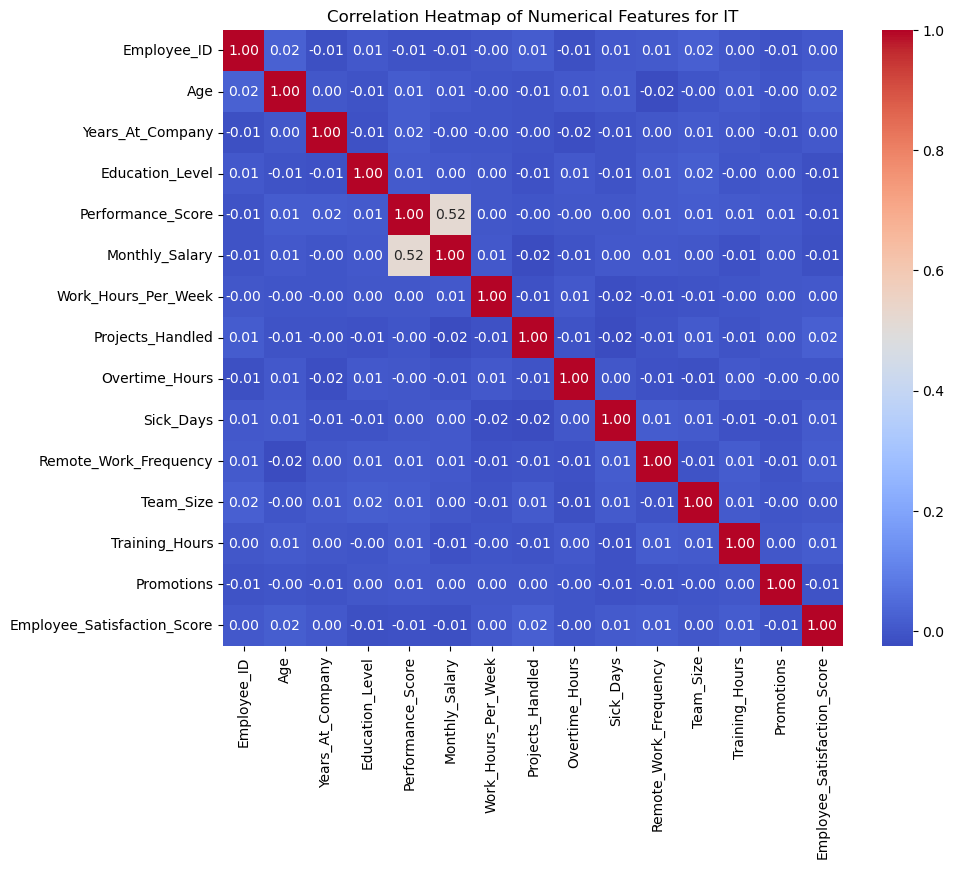

The most correlated feature with 'Performance_Score' is: Monthly_Salary


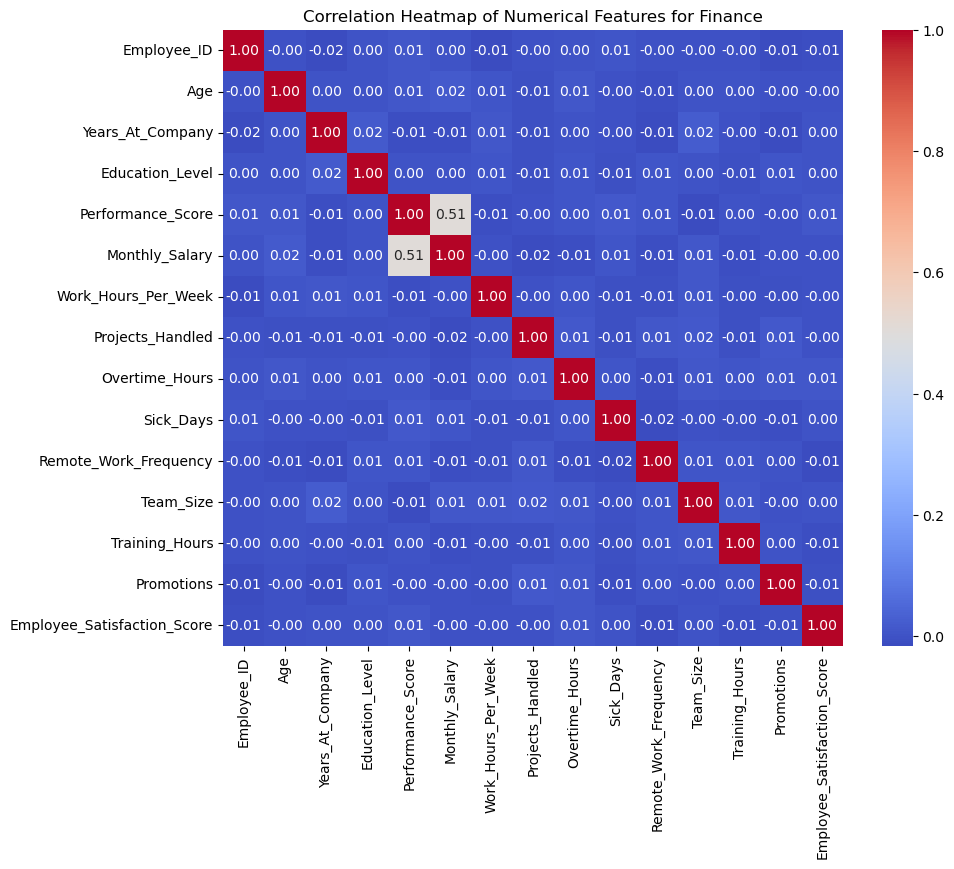

The most correlated feature with 'Performance_Score' is: Monthly_Salary


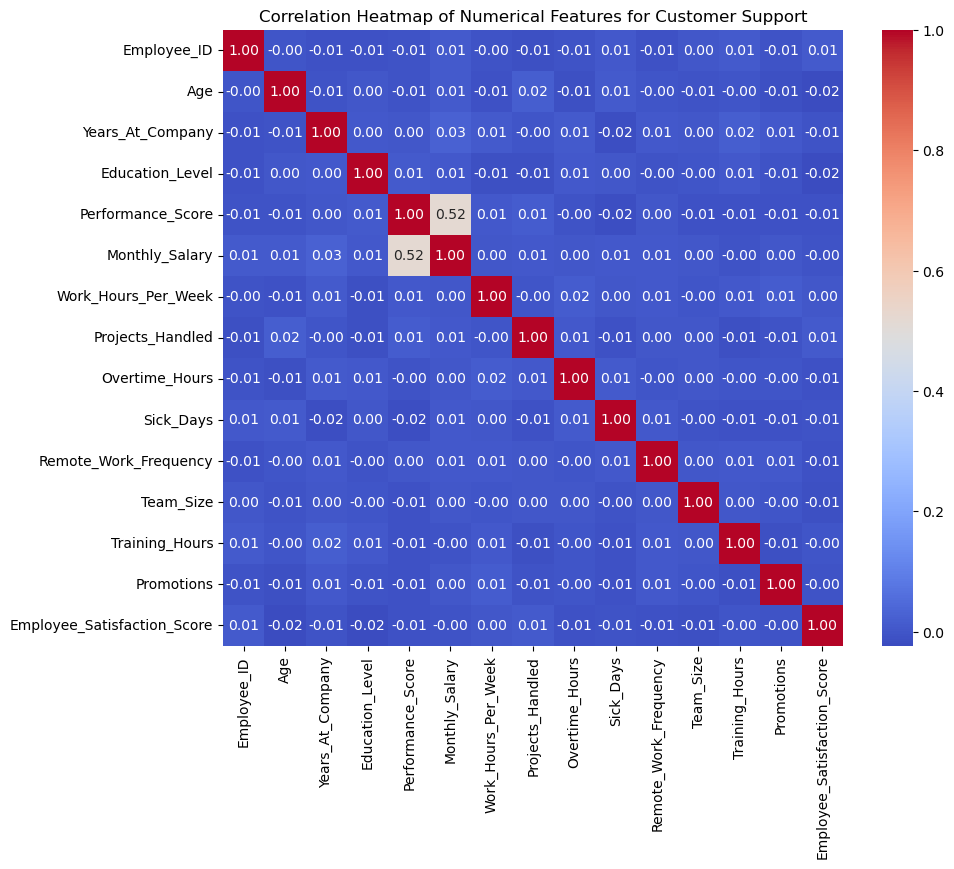

The most correlated feature with 'Performance_Score' is: Monthly_Salary


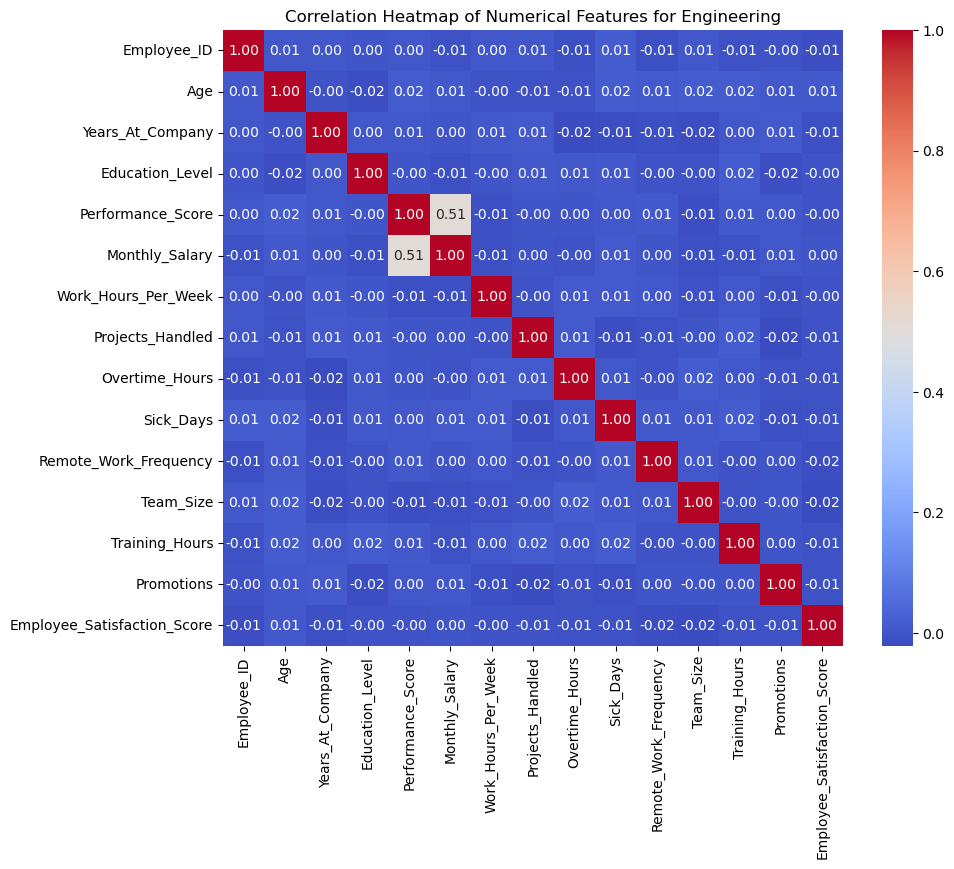

The most correlated feature with 'Performance_Score' is: Monthly_Salary


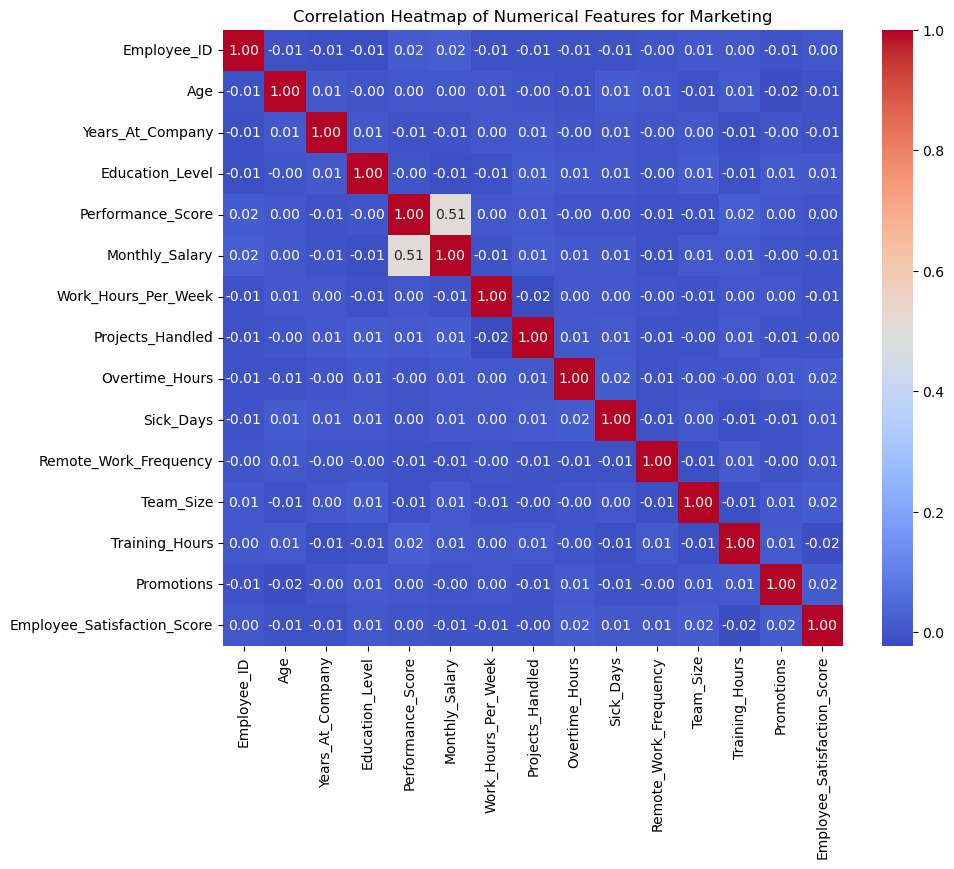

The most correlated feature with 'Performance_Score' is: Monthly_Salary


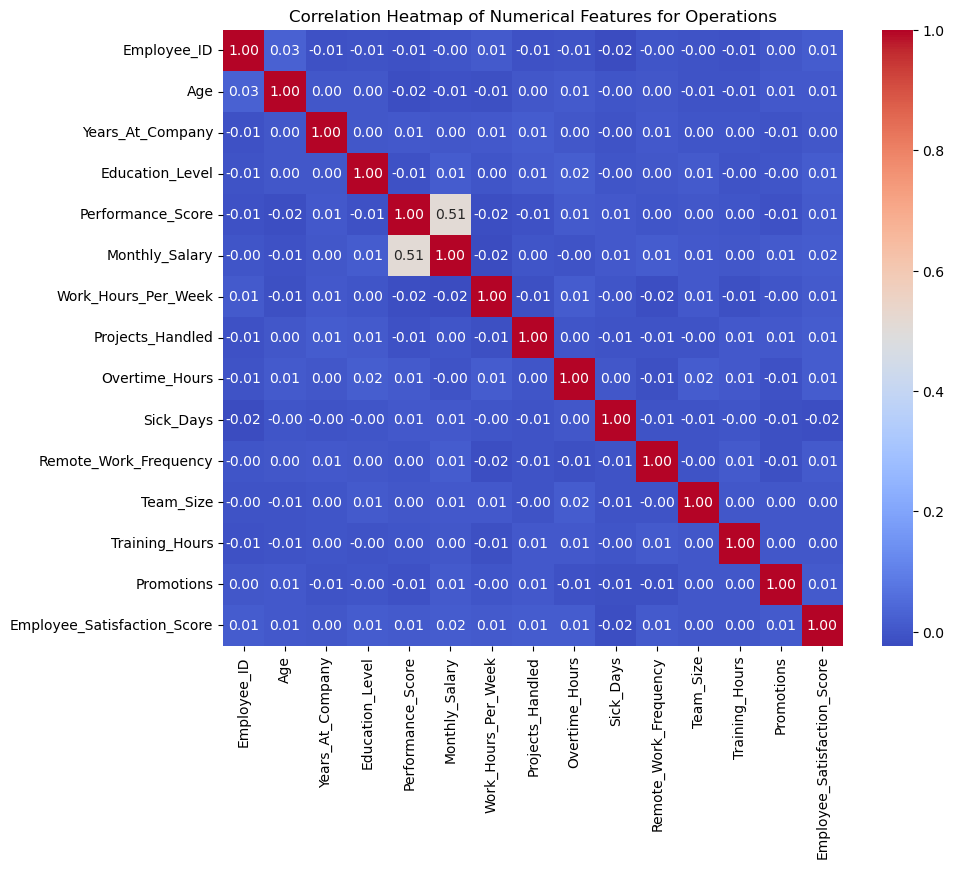

The most correlated feature with 'Performance_Score' is: Monthly_Salary


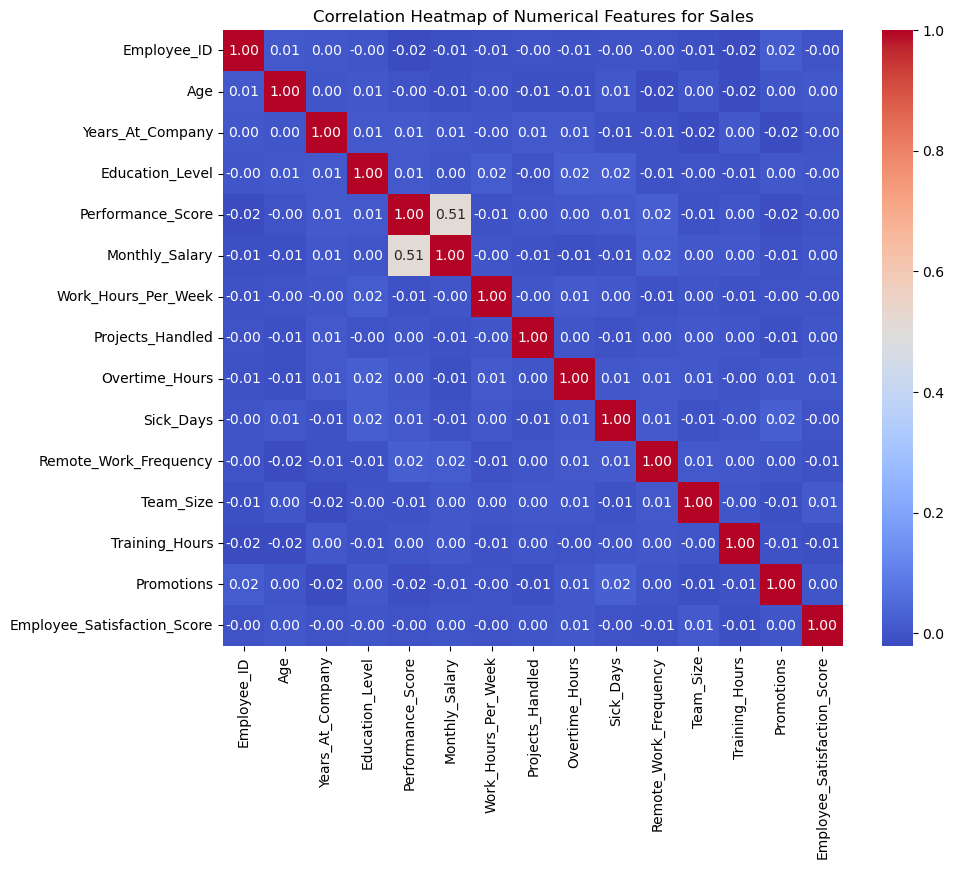

The most correlated feature with 'Performance_Score' is: Monthly_Salary


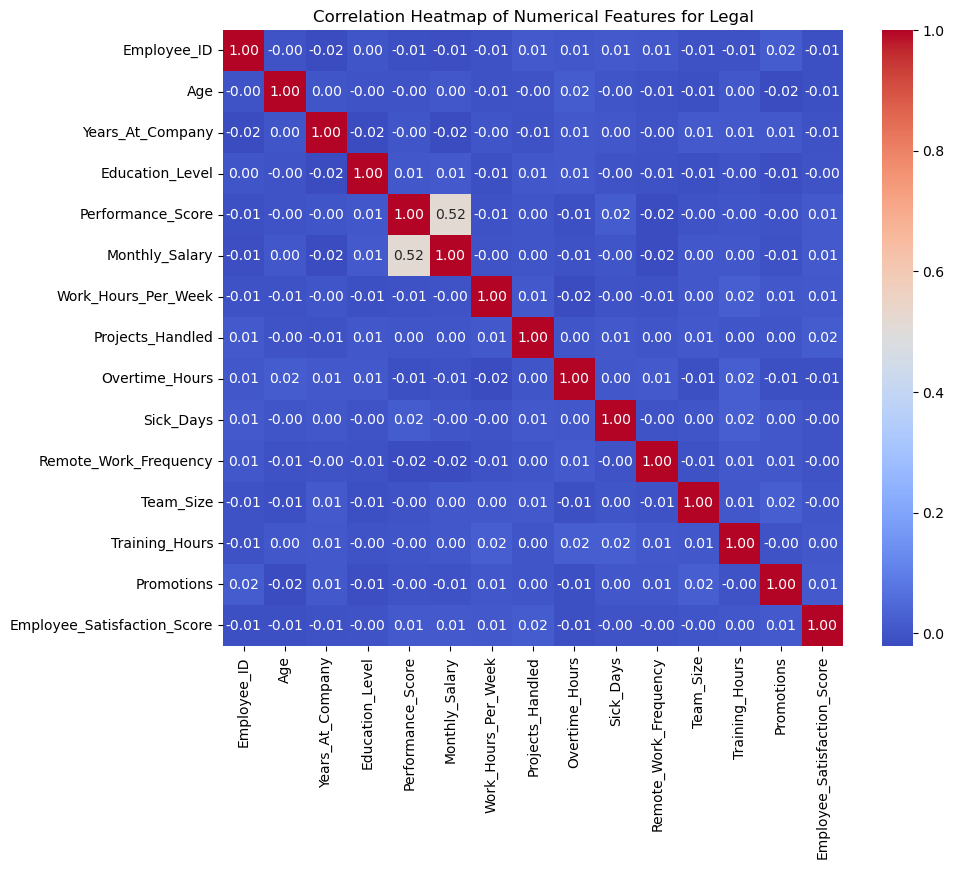

The most correlated feature with 'Performance_Score' is: Monthly_Salary


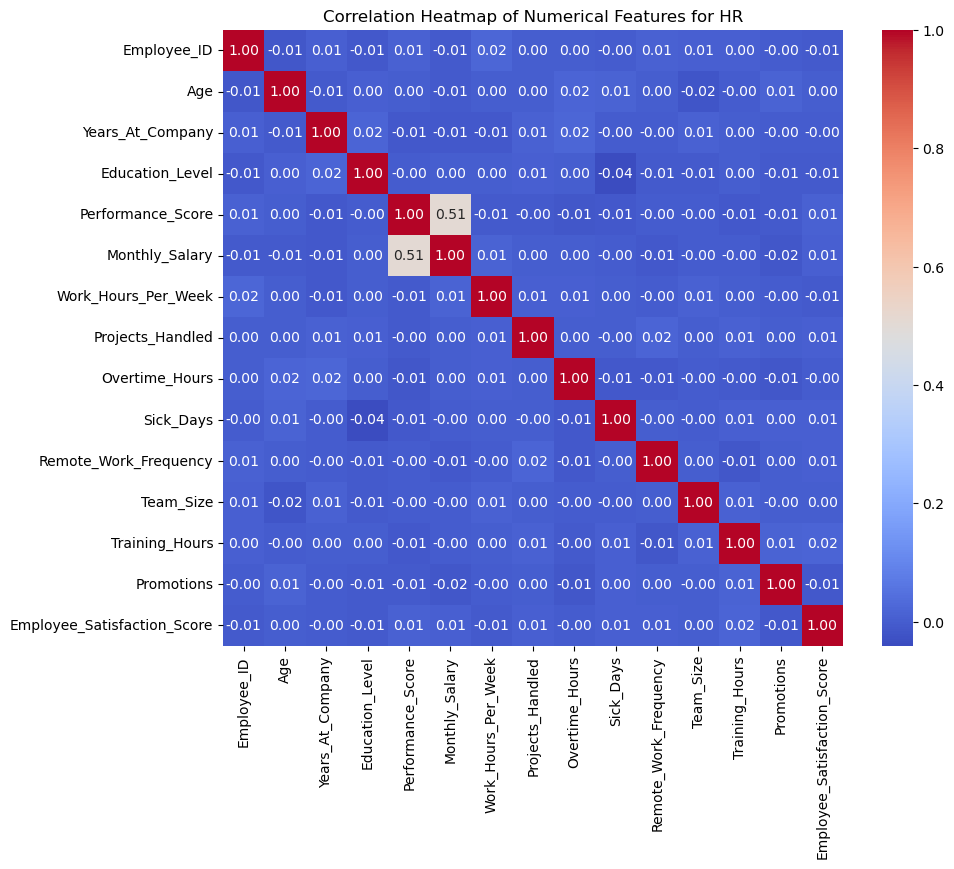

The most correlated feature with 'Performance_Score' is: Monthly_Salary


In [74]:

# Iterate through each department dataset
for department, dept_data in department_data.items():
    #create a correlation heatmap for each department
    # Select only the numerical features from the dataset
    numerical_features = dept_data.select_dtypes(include=['float64', 'int64'])

    # Compute the correlation matrix for numerical features
    correlation_matrix = numerical_features.corr()

    # Display the correlation matrix
    correlation_matrix


    # Plot a heatmap to visualize the correlation between numerical features
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Heatmap of Numerical Features for {department}')
    plt.show()

    # Identify the most correlated feature with the target variable 'Performance_Score'
    target = 'Performance_Score'
    most_correlated_feature = correlation_matrix[target].sort_values(ascending=False).index[1] 
    print(f"The most correlated feature with 'Performance_Score' is: {most_correlated_feature}")

Model Accuracy: 1.0

Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00     10068
           2       1.00      1.00      1.00     10016
           3       1.00      1.00      1.00     10030
           4       1.00      1.00      1.00      9934
           5       1.00      1.00      1.00      9952

    accuracy                           1.00     50000
   macro avg       1.00      1.00      1.00     50000
weighted avg       1.00      1.00      1.00     50000


Confusion Matrix:
 [[10068     0     0     0     0]
 [    0 10016     0     0     0]
 [    0     0 10030     0     0]
 [    0     0     0  9934     0]
 [    0     0     0     0  9952]]


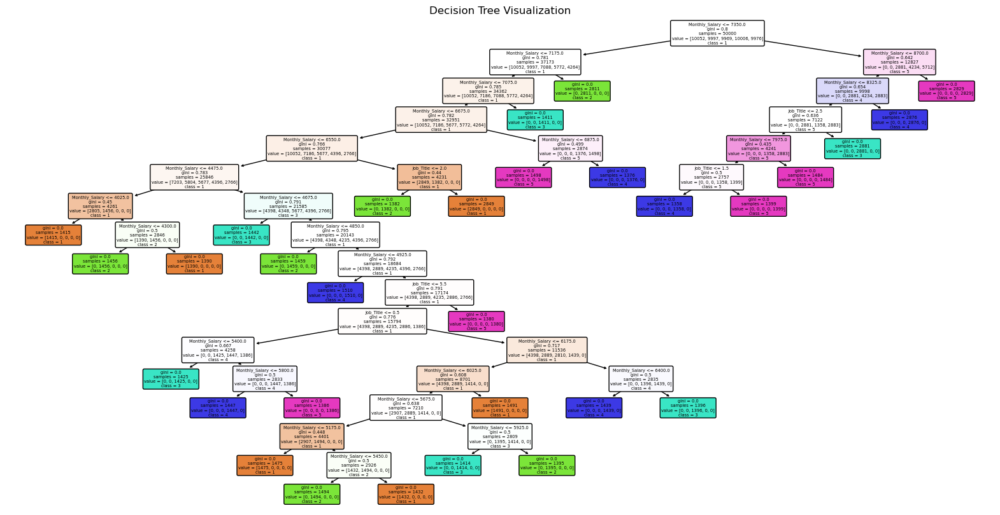

In [83]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

# Load your dataset
# Replace 'your_dataset.csv' with the actual path to your dataset
# data = pd.read_csv('your_dataset.csv')  # Uncomment and load your dataset here

# Define the target and feature set
target = 'Performance_Score'  # Replace with your actual target column
X = data.drop(columns=[target])  # Features
y = data[target]  # Target variable


# Encode categorical features
for col in X.select_dtypes(include=['object']).columns:
    encoder = LabelEncoder()
    X[col] = encoder.fit_transform(X[col])

# Encode the target variable if it's categorical
if y.dtype == 'object':
    y = LabelEncoder().fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Train a Decision Tree Classifier
tree_model = DecisionTreeClassifier(random_state=42, max_depth=None, min_samples_split=2)

tree_model.fit(X_train, y_train)

# Make predictions
y_pred = tree_model.predict(X_test)

# Evaluate the model
print("Model Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Visualize the decision tree
plt.figure(figsize=(20, 10))
plot_tree(
    tree_model, 
    feature_names=X.columns.tolist(), 
    class_names=[str(cls) for cls in np.unique(y)], 
    filled=True, 
    rounded=True
)
plt.title("Decision Tree Visualization")
plt.show()



Building regression tree for department: IT

Department: IT
Mean Squared Error: 0.27964071856287426
R-squared Score: 0.8635897502273387



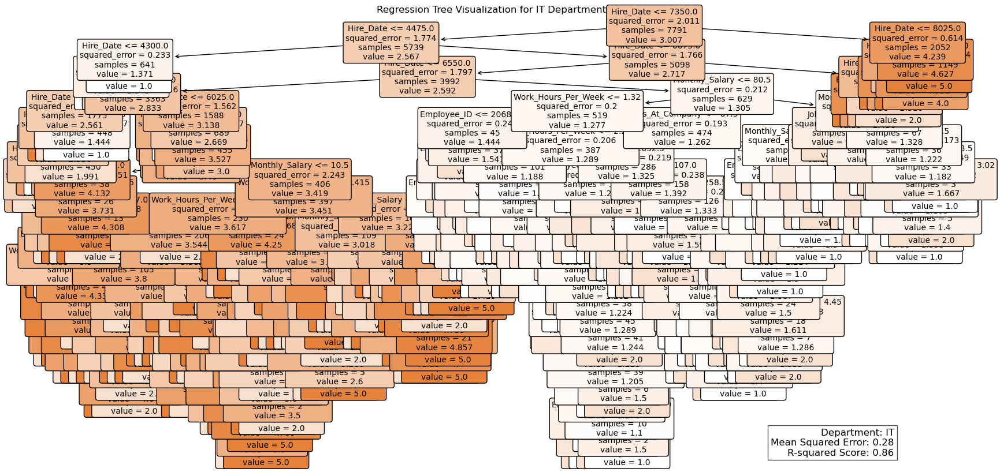


Building regression tree for department: Finance

Department: Finance
Mean Squared Error: 0.26458333333333334
R-squared Score: 0.8677642690381597



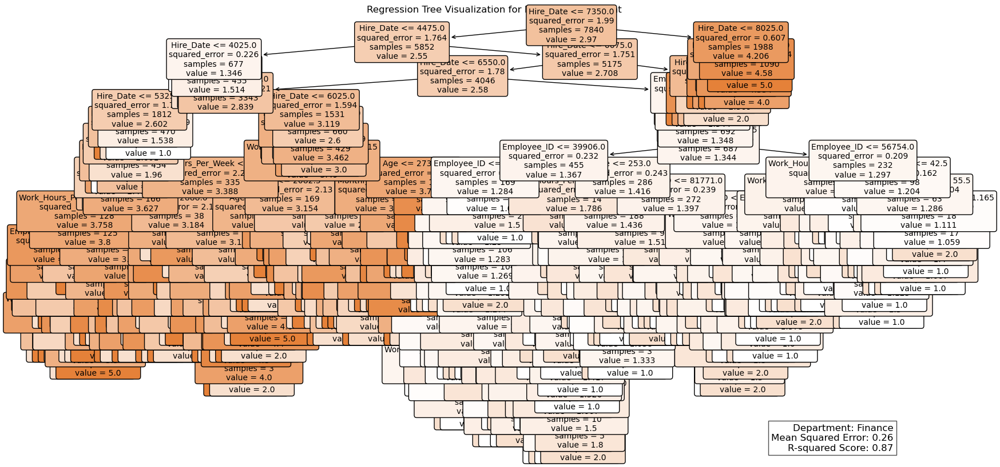


Building regression tree for department: Customer Support

Department: Customer Support
Mean Squared Error: 0.2962518740629685
R-squared Score: 0.8499617001578167



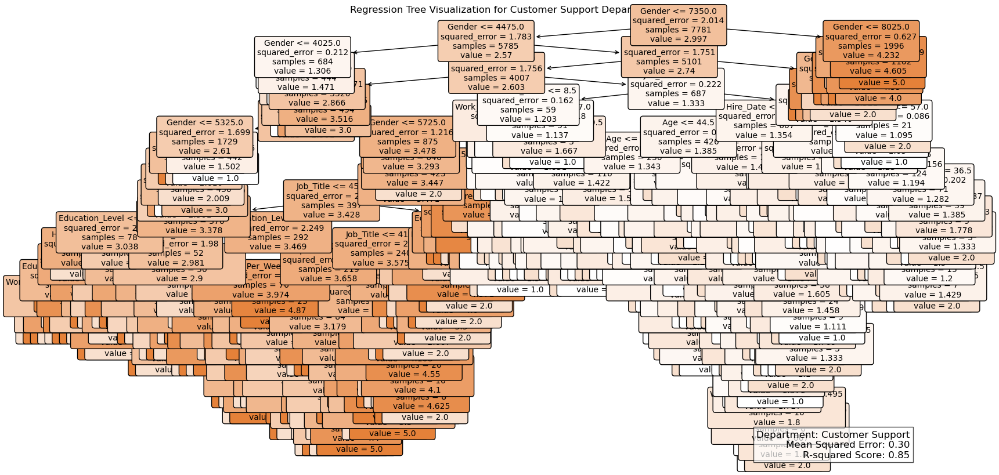


Building regression tree for department: Engineering

Department: Engineering
Mean Squared Error: 0.0
R-squared Score: 1.0



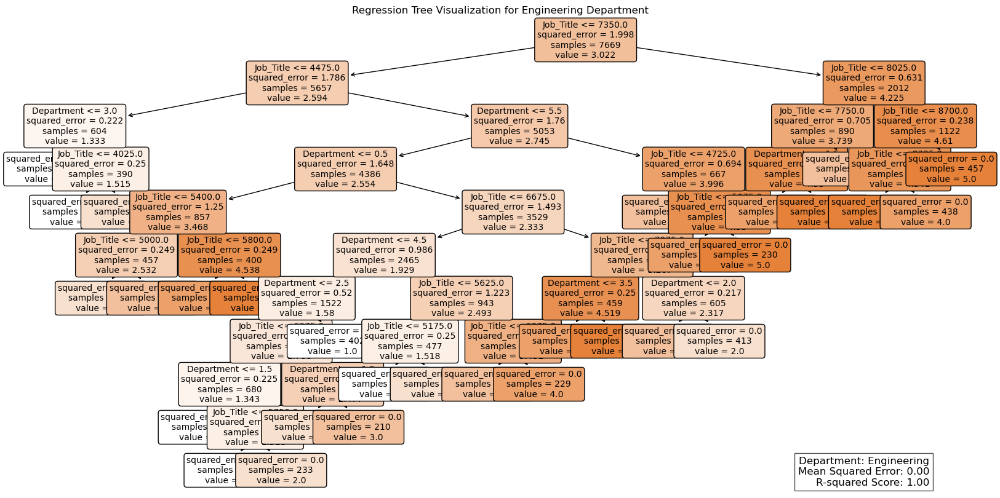


Building regression tree for department: Marketing

Department: Marketing
Mean Squared Error: 0.30074294205052005
R-squared Score: 0.8492365090808376



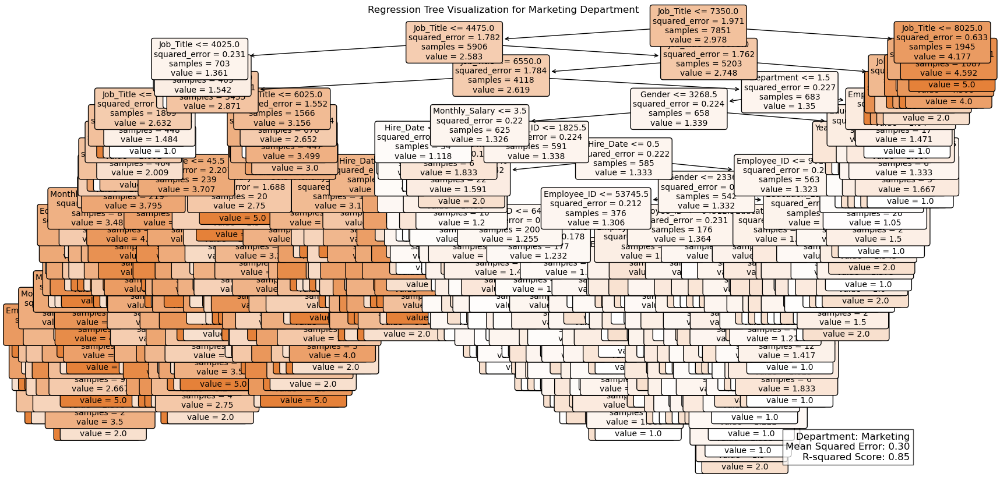


Building regression tree for department: Operations

Department: Operations
Mean Squared Error: 0.2760059612518629
R-squared Score: 0.8618686935155254



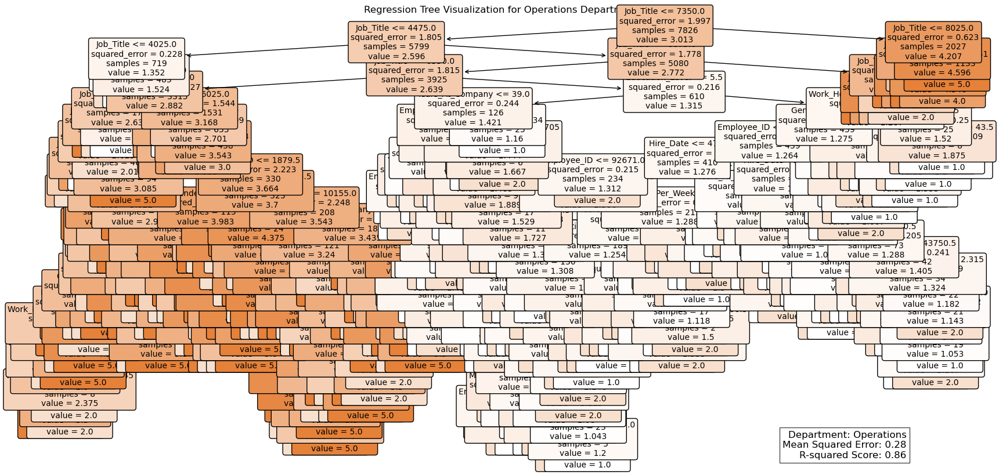


Building regression tree for department: Sales

Department: Sales
Mean Squared Error: 0.26640695235241235
R-squared Score: 0.8652430069604472



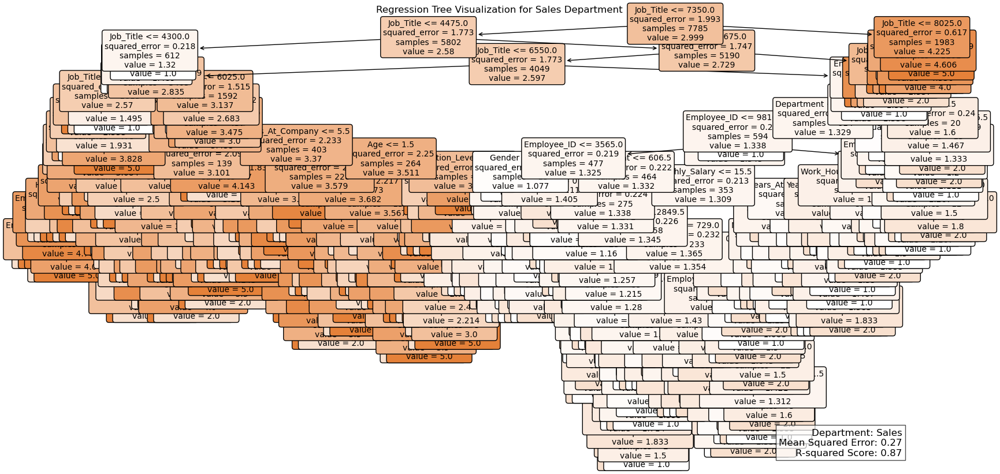


Building regression tree for department: Legal

Department: Legal
Mean Squared Error: 0.0
R-squared Score: 1.0



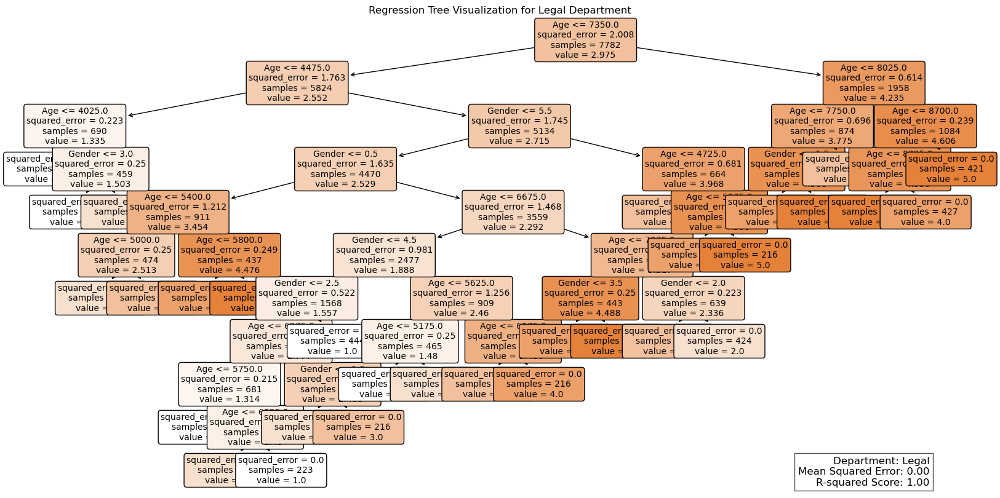


Building regression tree for department: HR

Department: HR
Mean Squared Error: 0.0
R-squared Score: 1.0



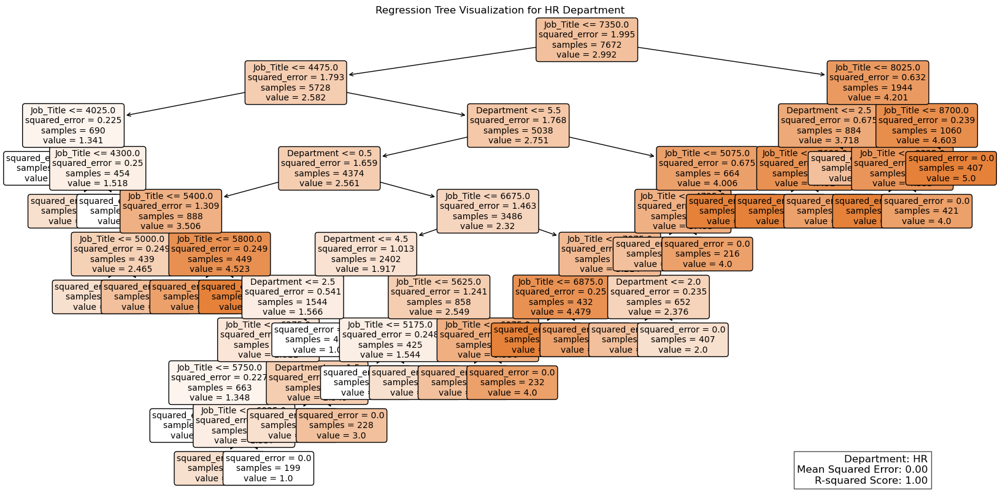

In [85]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

# Iterate through each department dataset
for department, dept_data in department_data.items():
    print(f"\nBuilding regression tree for department: {department}\n")

    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])
        
    
    # Feature selection (Select top 10 features based on f_regression)
    selector = SelectKBest(score_func=f_regression, k=10)
    X_selected = selector.fit_transform(X, y)

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.3, random_state=42)

    # Train a Regression Tree Model
    tree_regressor = DecisionTreeRegressor(criterion='squared_error', random_state=42, max_depth=None)
    tree_regressor.fit(X_train, y_train)

    # Make predictions
    y_pred = tree_regressor.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Department: {department}")
    print(f"Mean Squared Error: {mse}")
    print(f"R-squared Score: {r2}\n")

    # Visualize the Regression Tree with Metrics
    plt.figure(figsize=(20, 10))
    plot_tree(
        tree_regressor,
        feature_names=X.columns.tolist(),
        filled=True,
        rounded=True,
        fontsize=10
    )
    # Add department metrics as a text box
    metrics_text = f"Department: {department}\nMean Squared Error: {mse:.2f}\nR-squared Score: {r2:.2f}"
    plt.gca().text(
        0.95, 0.01, metrics_text,
        transform=plt.gca().transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black')
    )
    plt.title(f"Regression Tree Visualization for {department} Department")
    plt.show()



Building logistic regression model for department: IT



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: IT
Accuracy: 0.30

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.51      0.41       695
           2       0.21      0.13      0.16       679
           3       0.21      0.07      0.11       644
           4       0.19      0.15      0.17       633
           5       0.35      0.58      0.44       689

    accuracy                           0.30      3340
   macro avg       0.26      0.29      0.26      3340
weighted avg       0.26      0.30      0.26      3340



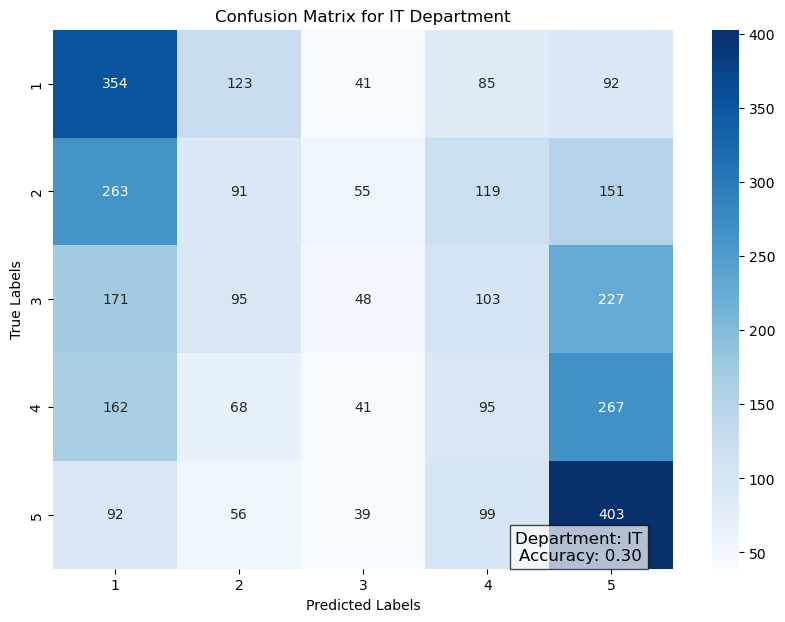


Building logistic regression model for department: Finance



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Finance
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.35      0.50      0.41       666
           2       0.24      0.26      0.25       674
           3       0.14      0.01      0.01       669
           4       0.20      0.18      0.19       673
           5       0.33      0.52      0.41       678

    accuracy                           0.29      3360
   macro avg       0.25      0.29      0.25      3360
weighted avg       0.25      0.29      0.25      3360



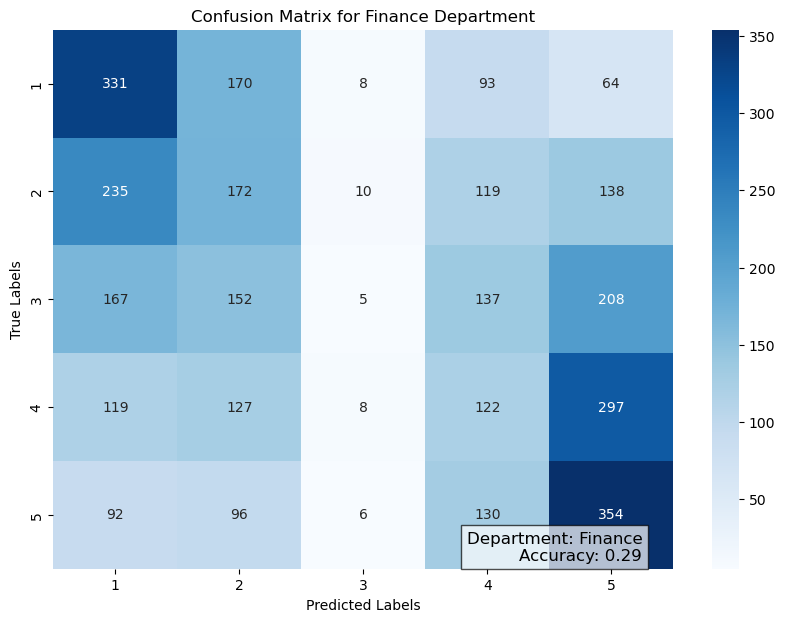


Building logistic regression model for department: Customer Support



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Customer Support
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.32      0.56      0.41       652
           2       0.22      0.08      0.12       682
           3       0.18      0.07      0.10       680
           4       0.19      0.14      0.16       663
           5       0.33      0.60      0.42       658

    accuracy                           0.29      3335
   macro avg       0.25      0.29      0.24      3335
weighted avg       0.25      0.29      0.24      3335



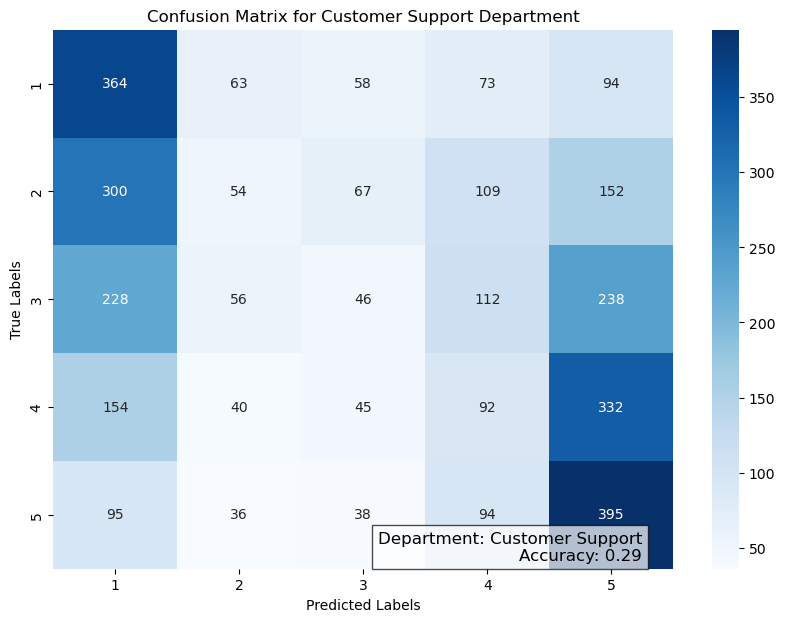


Building logistic regression model for department: Engineering



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Engineering
Accuracy: 0.28

Classification Report:
               precision    recall  f1-score   support

           1       0.33      0.46      0.39       658
           2       0.20      0.13      0.16       644
           3       0.21      0.18      0.19       645
           4       0.20      0.04      0.06       665
           5       0.32      0.61      0.42       675

    accuracy                           0.28      3287
   macro avg       0.25      0.28      0.24      3287
weighted avg       0.25      0.28      0.24      3287



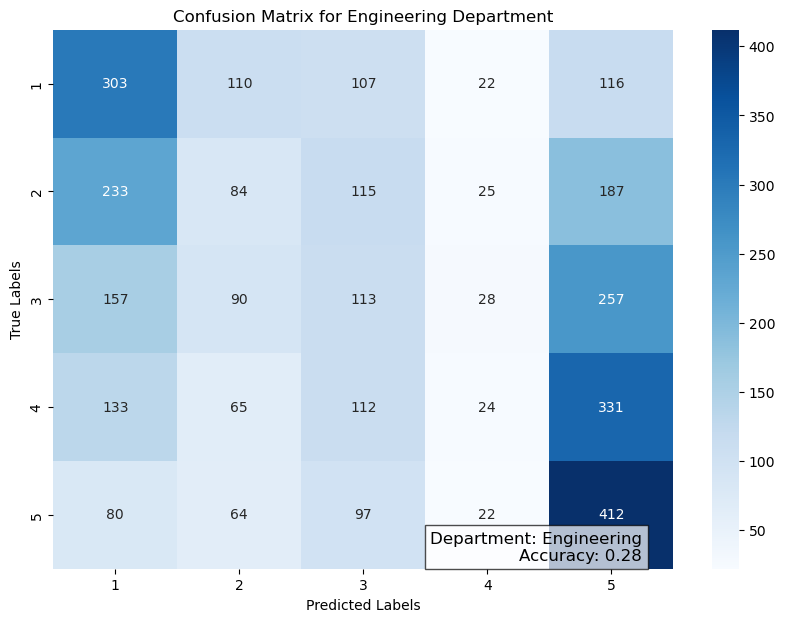


Building logistic regression model for department: Marketing



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Marketing
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.53      0.42       683
           2       0.20      0.08      0.12       664
           3       0.20      0.17      0.18       693
           4       0.22      0.11      0.15       661
           5       0.34      0.58      0.43       664

    accuracy                           0.29      3365
   macro avg       0.26      0.29      0.26      3365
weighted avg       0.26      0.29      0.26      3365



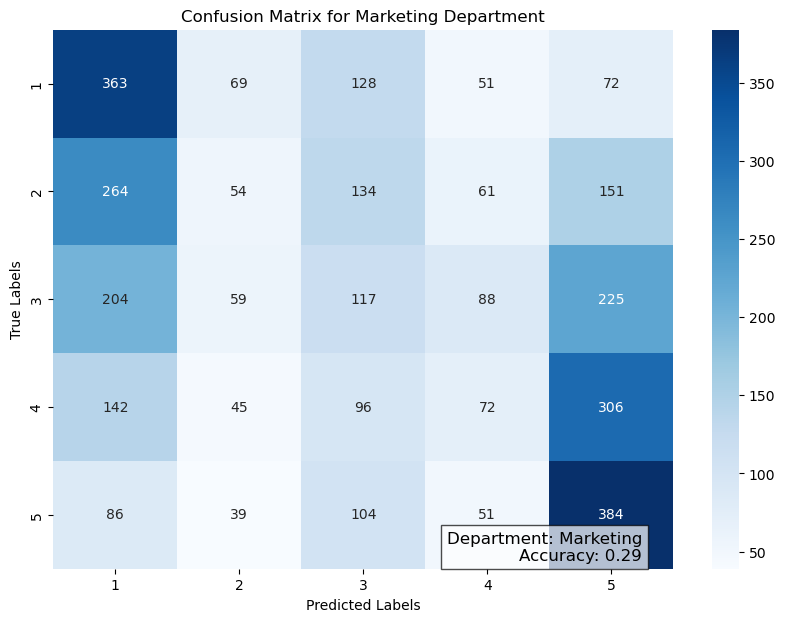


Building logistic regression model for department: Operations



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Operations
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.52      0.41       678
           2       0.18      0.05      0.08       672
           3       0.20      0.15      0.17       665
           4       0.23      0.16      0.19       680
           5       0.33      0.57      0.42       660

    accuracy                           0.29      3355
   macro avg       0.26      0.29      0.25      3355
weighted avg       0.26      0.29      0.25      3355



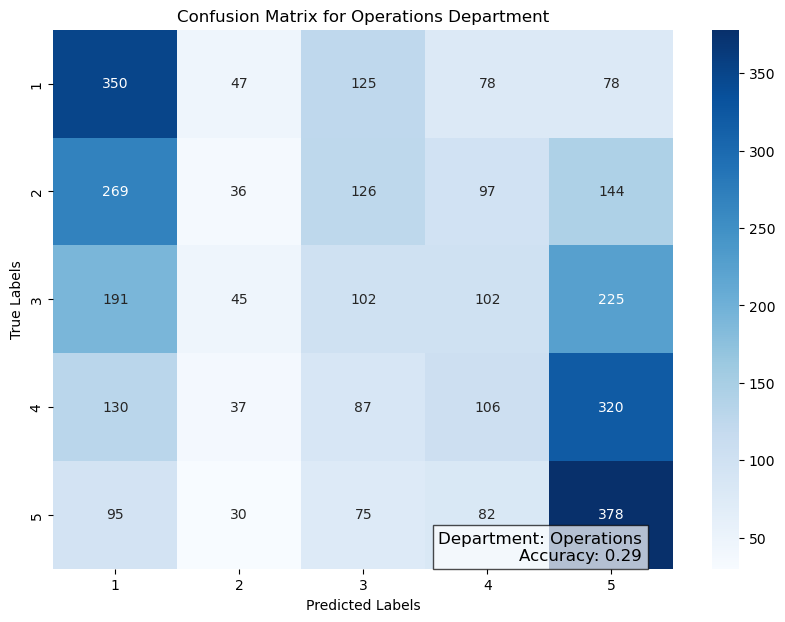


Building logistic regression model for department: Sales



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Sales
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.33      0.53      0.41       681
           2       0.19      0.09      0.12       660
           3       0.22      0.13      0.17       654
           4       0.26      0.12      0.17       718
           5       0.31      0.60      0.41       624

    accuracy                           0.29      3337
   macro avg       0.26      0.29      0.26      3337
weighted avg       0.26      0.29      0.25      3337



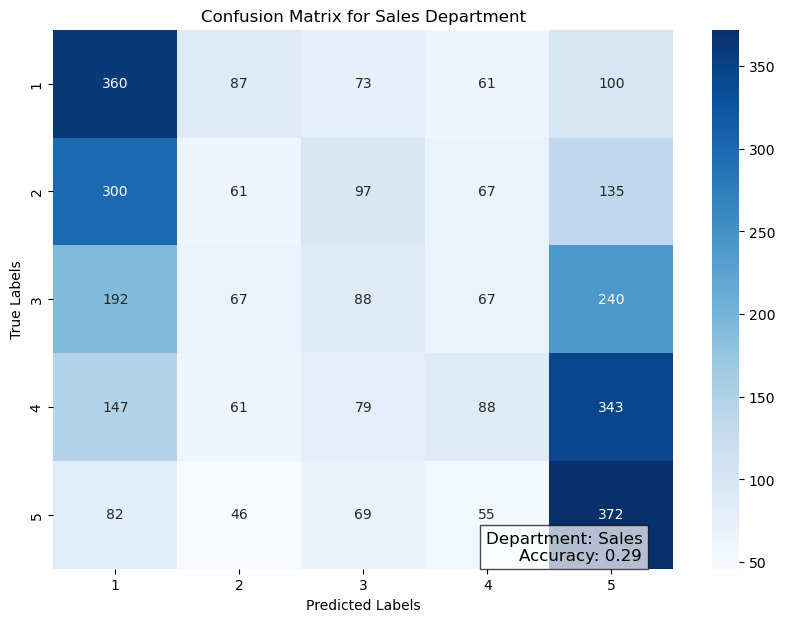


Building logistic regression model for department: Legal



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: Legal
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.34      0.53      0.41       705
           2       0.20      0.08      0.11       653
           3       0.19      0.14      0.16       619
           4       0.21      0.12      0.15       665
           5       0.34      0.56      0.42       694

    accuracy                           0.29      3336
   macro avg       0.26      0.28      0.25      3336
weighted avg       0.26      0.29      0.26      3336



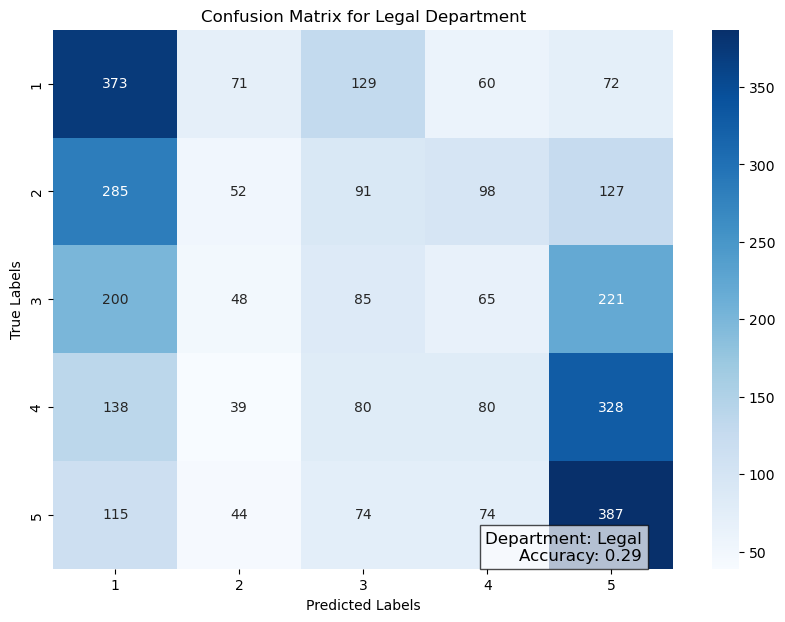


Building logistic regression model for department: HR



C:\Users\OWNER\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Department: HR
Accuracy: 0.29

Classification Report:
               precision    recall  f1-score   support

           1       0.33      0.51      0.40       647
           2       0.25      0.13      0.17       669
           3       0.22      0.16      0.18       645
           4       0.20      0.09      0.12       657
           5       0.33      0.58      0.42       670

    accuracy                           0.29      3288
   macro avg       0.26      0.29      0.26      3288
weighted avg       0.26      0.29      0.26      3288



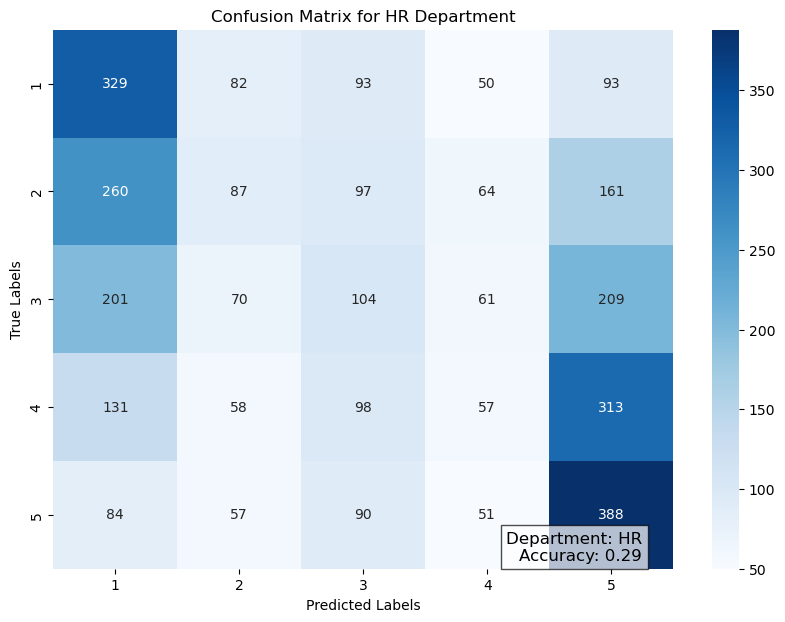

In [23]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

# Iterate through each department dataset
for department, dept_data in department_data.items():
    print(f"\nBuilding logistic regression model for department: {department}\n")

    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train a Logistic Regression Model
    logistic_model = LogisticRegression(max_iter=1000, random_state=42)
    logistic_model.fit(X_train, y_train)

    # Make predictions
    y_pred = logistic_model.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    conf_matrix = confusion_matrix(y_test, y_pred)

    print(f"Department: {department}")
    print(f"Accuracy: {accuracy:.2f}")
    print("\nClassification Report:\n", report)

    # Visualize the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(
        conf_matrix,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=np.unique(y),
        yticklabels=np.unique(y)
    )
    plt.title(f"Confusion Matrix for {department} Department")
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')

    # Add department metrics as a text box
    metrics_text = f"Department: {department}\nAccuracy: {accuracy:.2f}"
    plt.gca().text(
        0.95, 0.01, metrics_text,
        transform=plt.gca().transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black')
    )
    plt.show()



Building multiple linear regression model for department: IT

Department: IT
Mean Squared Error: 1.50
R-squared Score: 0.27



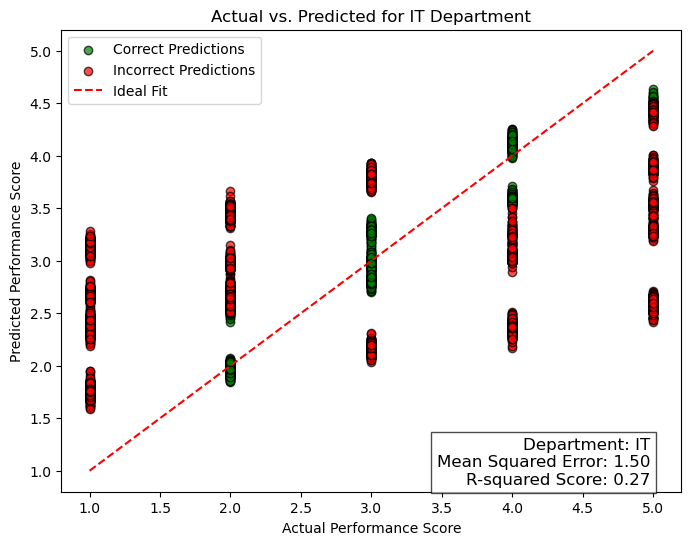


Building multiple linear regression model for department: Finance

Department: Finance
Mean Squared Error: 1.46
R-squared Score: 0.27



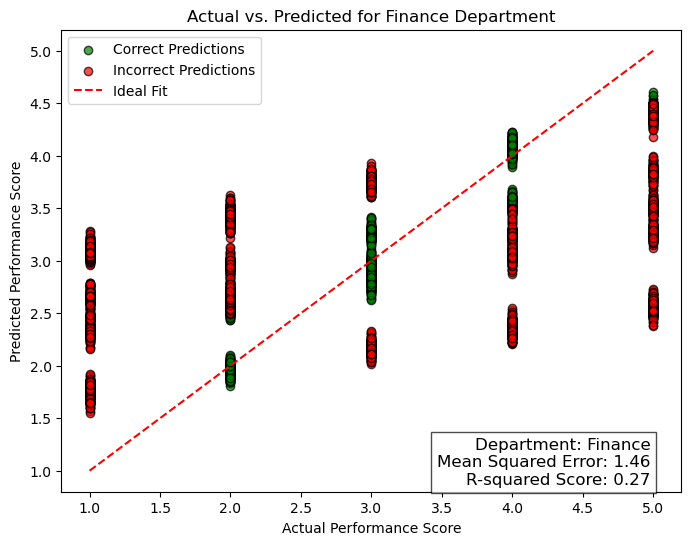


Building multiple linear regression model for department: Customer Support

Department: Customer Support
Mean Squared Error: 1.44
R-squared Score: 0.27



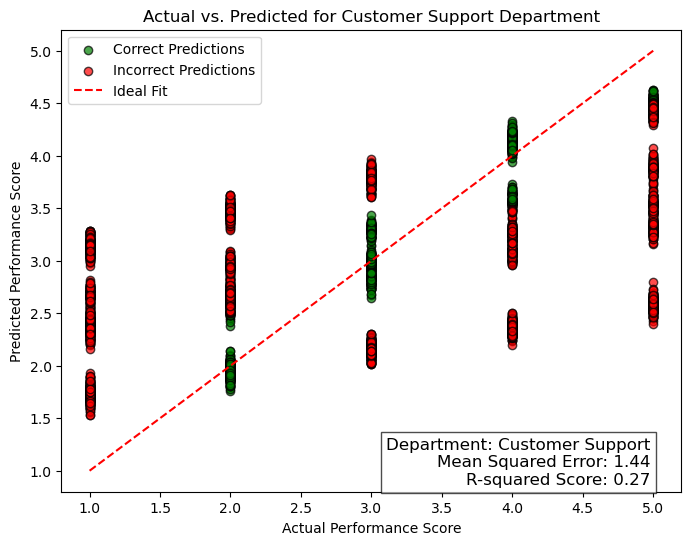


Building multiple linear regression model for department: Engineering

Department: Engineering
Mean Squared Error: 1.52
R-squared Score: 0.25



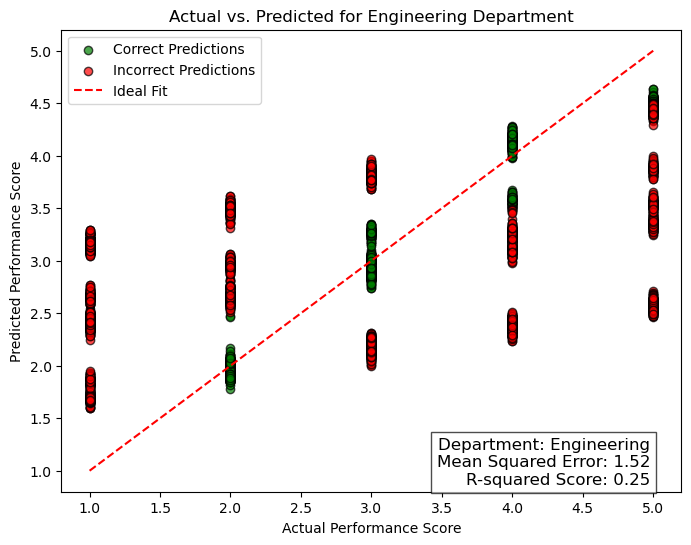


Building multiple linear regression model for department: Marketing

Department: Marketing
Mean Squared Error: 1.45
R-squared Score: 0.27



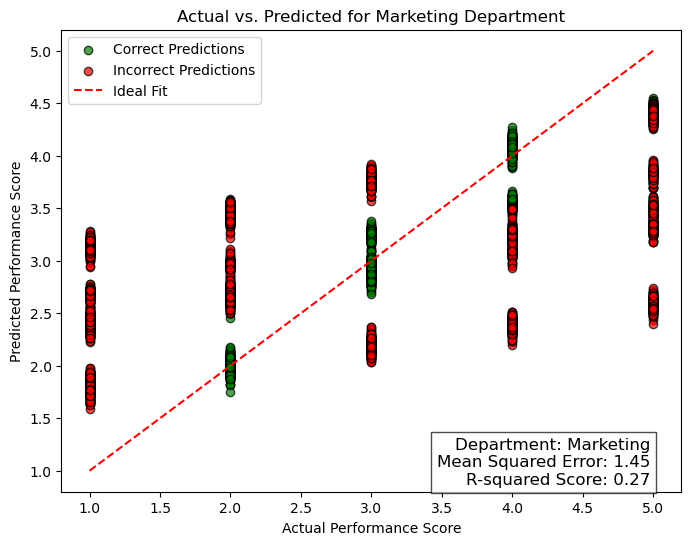


Building multiple linear regression model for department: Operations

Department: Operations
Mean Squared Error: 1.48
R-squared Score: 0.26



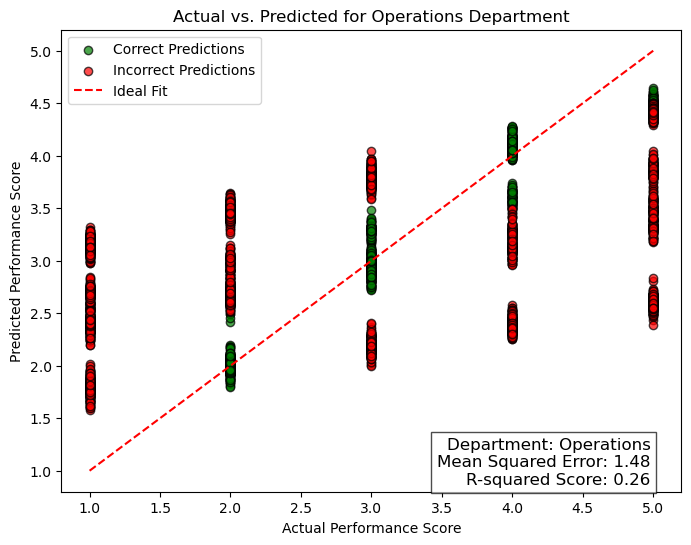


Building multiple linear regression model for department: Sales

Department: Sales
Mean Squared Error: 1.43
R-squared Score: 0.28



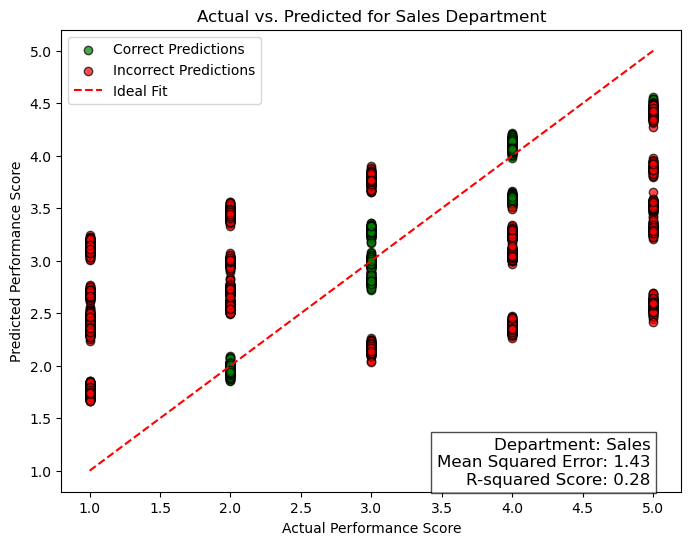


Building multiple linear regression model for department: Legal

Department: Legal
Mean Squared Error: 1.50
R-squared Score: 0.27



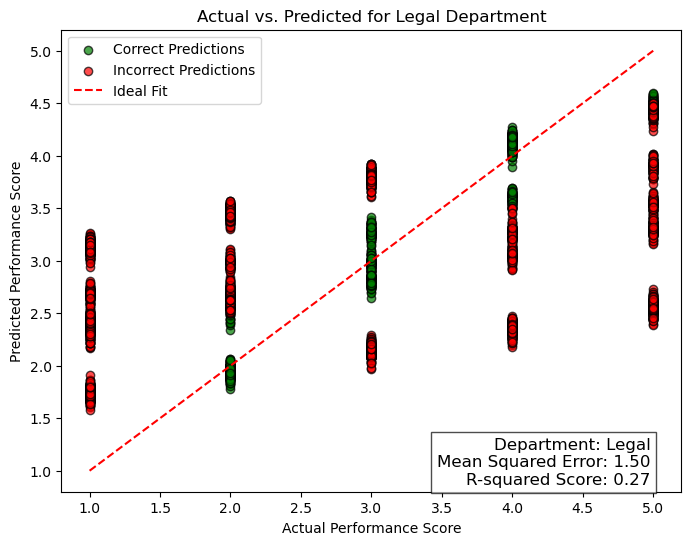


Building multiple linear regression model for department: HR

Department: HR
Mean Squared Error: 1.47
R-squared Score: 0.27



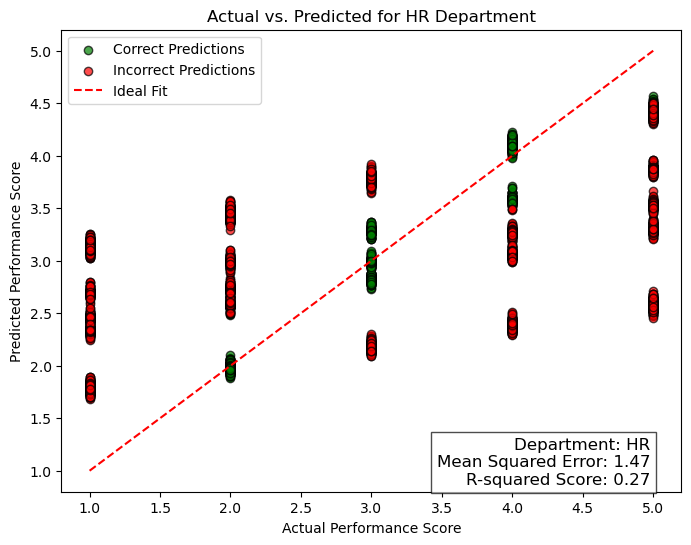

In [87]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

# Tolerance for considering predictions as "correct"
tolerance = 0.5  # Adjust this value as needed

# Iterate through each department dataset
for department, dept_data in department_data.items():
    print(f"\nBuilding multiple linear regression model for department: {department}\n")

    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])
        
    scaler = StandardScaler()
    X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
    

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Train a Multiple Linear Regression Model
    linear_model = LinearRegression()
    linear_model.fit(X_train, y_train)

    # Make predictions
    y_pred = linear_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Department: {department}")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R-squared Score: {r2:.2f}\n")

    # Determine correct (green) and incorrect (red) predictions
    correct = np.abs(y_test - y_pred) <= tolerance
    incorrect = ~correct

    # Plot actual vs. predicted values with color-coded points
    plt.figure(figsize=(8, 6))
    plt.scatter(
        y_test[correct], y_pred[correct], c='green', label='Correct Predictions', edgecolors='k', alpha=0.7
    )
    plt.scatter(
        y_test[incorrect], y_pred[incorrect], c='red', label='Incorrect Predictions', edgecolors='k', alpha=0.7
    )
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Ideal Fit')  # Reference line

    # Add department metrics as a text box
    metrics_text = f"Department: {department}\nMean Squared Error: {mse:.2f}\nR-squared Score: {r2:.2f}"
    plt.gca().text(
        0.95, 0.01, metrics_text,
        transform=plt.gca().transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(facecolor='white', alpha=0.7, edgecolor='black')
    )

    # Graph labels and title
    plt.xlabel('Actual Performance Score')
    plt.ylabel('Predicted Performance Score')
    plt.title(f'Actual vs. Predicted for {department} Department')
    plt.legend()
    plt.show()


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# List of department-specific datasets
department_data = {
    'IT': dfIt,
    'Finance': dfFin,
    'Customer Support': dfSup,
    'Engineering': dfEng,
    'Marketing': dfMark,
    'Operations': dfOper,
    'Sales': dfSales,
    'Legal': dfLegal,
    'HR': dfHr
}

for department, dept_data in department_data.items():
    
    # Define features and target
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    from sklearn.preprocessing import LabelEncoder
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])


    
    X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=17,test_size=0.3)
    
    rf = RandomForestClassifier()
    rf.fit(X_train,y_train)
    
    y_pred = rf.predict(X_test)
    
    rf.score(X_test, y_test)
    
    print(f"Report for {department} Random Forest model")
    print(classification_report(y_test,y_pred))
    
    

In [96]:
!pip install xgboost
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor

for department, dept_data in department_data.items():
    # Assume `dept_data` is your DataFrame
    target = 'Performance_Score'  # Replace with the actual target column
    X = dept_data.drop(columns=[target])  # Features
    y = dept_data[target]  # Target variable

    # Handle missing values
    for col in X.columns:
        if X[col].dtype in ['float64', 'int64']:  # Numeric columns
            X[col].fillna(X[col].mean(), inplace=True)
        elif X[col].dtype == 'object':  # Categorical columns
            X[col].fillna(X[col].mode()[0], inplace=True)

    # Encode categorical features if present
    for col in X.select_dtypes(include=['object']).columns:
        encoder = LabelEncoder()
        X[col] = encoder.fit_transform(X[col])

    # Scale features using StandardScaler
    scaler = StandardScaler()
    X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
    
     # Feature selection (Select top 10 features based on f_regression)
    selector = SelectKBest(score_func=f_regression, k=10)
    X_selected = selector.fit_transform(X, y)
    
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.3,random_state=42)
    
    # Train an XGBoost Regressor
    xgb_model = XGBRegressor(random_state=42)
    
    xgb_model.fit(X_train, y_train)

    y_pred = xgb_model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"XGBoost Model Performance for {department}:")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R-squared Score: {r2:.2f}\n")


XGBoost Model Performance for IT:
Mean Squared Error: 0.18
R-squared Score: 0.91

XGBoost Model Performance for Finance:
Mean Squared Error: 0.16
R-squared Score: 0.92

XGBoost Model Performance for Customer Support:
Mean Squared Error: 0.17
R-squared Score: 0.91

XGBoost Model Performance for Engineering:
Mean Squared Error: 0.00
R-squared Score: 1.00

XGBoost Model Performance for Marketing:
Mean Squared Error: 0.18
R-squared Score: 0.91

XGBoost Model Performance for Operations:
Mean Squared Error: 0.18
R-squared Score: 0.91

XGBoost Model Performance for Sales:
Mean Squared Error: 0.17
R-squared Score: 0.91

XGBoost Model Performance for Legal:
Mean Squared Error: 0.00
R-squared Score: 1.00

XGBoost Model Performance for HR:
Mean Squared Error: 0.00
R-squared Score: 1.00

